In [1]:
# !cp -r /content/drive/MyDrive/exp_data/ .
# !cp ./drive/MyDrive/best.pth . 
# !cp ./drive/MyDrive/new_best.pth . 
# !cp ./drive/MyDrive/kouame_best.pth . 

# Imports

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import matplotlib.patches as mpatches
import scipy.io
import tqdm
from tqdm.notebook import tqdm

In [2]:
color_ls = [f'C{i}' for i in range(10)]

# Model Architecture
### Inspired by the paper [Noise Reduction in ECG Signals Using Fully Convolutional Denoising Autoencoders](https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=8693790)

<img src="https://drive.google.com/uc?export=view&id=1ax2wYEjzQvtnDteYlxKwfqcHP5Q2ZBNM"  width="600" height="500">



In [3]:
class DAE(nn.Module):

  def __init__(self, input_size=1024, kernel_size=16):
    super(DAE, self).__init__()

    self.activation = nn.ELU()
    self.kernel_size = kernel_size
    self.input_size = input_size
    self.padding = (kernel_size - 1) // 2

    slot = self.input_size

    self.conv1 = nn.Conv1d(1, 40, self.kernel_size, stride=2, padding=self.padding)
    self.conv_bn1 = nn.BatchNorm1d(40)
    self.conv2 = nn.Conv1d(40, 20, self.kernel_size, stride=2, padding=self.padding)
    self.conv_bn2 = nn.BatchNorm1d(20)
    self.conv3 = nn.Conv1d(20, 20, self.kernel_size, stride=2, padding=self.padding)
    self.conv_bn3 = nn.BatchNorm1d(20)
    self.conv4 = nn.Conv1d(20, 20, self.kernel_size, stride=2, padding=self.padding)
    self.conv_bn4 = nn.BatchNorm1d(20)
    self.conv5 = nn.Conv1d(20, 40, self.kernel_size, stride=2, padding=self.padding)
    self.conv_bn5 = nn.BatchNorm1d(40)
    self.conv6 = nn.Conv1d(40, 1, self.kernel_size, stride=1, padding='same')
    self.deconv0 = nn.ConvTranspose1d(1, 1, self.kernel_size - 1, stride=1, padding=self.padding)
    self.deconv_bn0 = nn.BatchNorm1d(1)
    self.deconv1 = nn.ConvTranspose1d(1, 40, self.kernel_size, stride=2, padding=self.padding)
    self.deconv_bn1 = nn.BatchNorm1d(40)
    self.deconv2 = nn.ConvTranspose1d(40, 20, self.kernel_size, stride=2, padding=self.padding)
    self.deconv_bn2 = nn.BatchNorm1d(20)
    self.deconv3 = nn.ConvTranspose1d(20, 20, self.kernel_size, stride=2, padding=self.padding)
    self.deconv_bn3 = nn.BatchNorm1d(20)
    self.deconv4 = nn.ConvTranspose1d(20, 20, self.kernel_size, stride=2, padding=self.padding)
    self.deconv_bn4 = nn.BatchNorm1d(20)
    self.deconv5 = nn.ConvTranspose1d(20, 40, self.kernel_size, stride=2, padding=self.padding)
    self.deconv_bn5 = nn.BatchNorm1d(40)
    self.deconv6 = nn.ConvTranspose1d(
        40, 
        1, 
        self.kernel_size - 1, 
        stride=1, 
        padding=(self.kernel_size - 1) // 2
    )
    
  def forward(self, x):
    # encoder
    x = self.conv1(x)
    x = self.conv_bn1(x)
    x = self.activation(x)
    
    x = self.conv2(x)
    x = self.conv_bn2(x)
    x = self.activation(x)
    
    x = self.conv3(x)
    x = self.conv_bn3(x)
    x = self.activation(x)
    
    x = self.conv4(x)
    x = self.conv_bn4(x)
    x = self.activation(x)
    
    x = self.conv5(x)
    x = self.conv_bn5(x)
    x = self.activation(x)
    
    x = self.conv6(x)
    x = self.activation(x)

    # decoder
    x = self.deconv0(x)
    x = self.deconv_bn0(x)
    x = self.activation(x)

    x = self.deconv1(x)
    x = self.deconv_bn1(x)
    x = self.activation(x)
    
    x = self.deconv2(x)
    x = self.deconv_bn2(x)
    x = self.activation(x)
    
    x = self.deconv3(x)
    x = self.deconv_bn3(x)
    x = self.activation(x)
    
    x = self.deconv4(x)
    x = self.deconv_bn4(x)
    x = self.activation(x)
    
    x = self.deconv5(x)
    x = self.deconv_bn5(x)
    x = self.activation(x)
    
    x = self.deconv6(x)
    x = self.activation(x)

    return x


# Helper functions

In [4]:
# read *.mat files
def read_data(filename):
  mat = scipy.io.loadmat(filename)
  return mat

# function that plots multiple signals
def plotme(*arrs, lg=None, colors=None, ax_t=None, figsize=(30,10)):
  if ax_t is None:
    ax_t = ['Amplitude', 'N of samples']
  if colors is None:
    colors = color_ls
  if lg is None:
    lg = []
  plt.figure(figsize=figsize)
  for i in range(len(arrs)):
    plt.plot(arrs[i], color=colors[i % len(colors)])

  patch_ls = []
  for i in range(len(lg)):
    patch = mpatches.Patch(
        color=colors[i % len(colors)], 
        label=lg[i],
    )
    patch_ls.append(patch)

  plt.legend(handles=patch_ls, prop={'size': 24})
  plt.ylabel(ax_t[0])
  plt.xlabel(ax_t[1])
  plt.show()

# Make a plot report that resembles the plots produced in the paper
def plot_report(clean, noisy, recons, output, lg =None, ax_t=None, figsize=(30,40)):
  fig, axes = plt.subplots(4, figsize=figsize)

  if ax_t is None:
    ax_t = ['Amplitude', 'N of Samples']
  if lg is None:
    lg = [
        'Clean Sig.',
        'Noisy Signal',
        'Org. Recons. Sig.',
        'Our Recons. Sig.',
    ]
  
  for i in range(len(axes)):
    axes[i].set_ylabel(ax_t[0])
    axes[i].set_xlabel(ax_t[1])
  
  axes[0].plot(clean, color='C0')
  axes[0].legend(
      handles=[
          mpatches.Patch(
              color='C0', 
              label=lg[0],
          )
      ],
      prop={'size': 24},
  )
  axes[0].set_title('Clean Signal')
  
  axes[1].plot(noisy, color='C0')
  axes[1].legend(
      handles=[
          mpatches.Patch(
              color='C0', 
              label=lg[1],
          )
      ],
      prop={'size': 24},
  )
  axes[1].set_title('Noisy Signal')
  
  axes[2].plot(clean, color='C0')
  axes[2].plot(recons, color='C3')
  axes[2].legend(
      handles=[
          mpatches.Patch(
              color='C0', 
              label=lg[0],
          ),
          mpatches.Patch(
              color='C3', 
              label=lg[2],
          )
      ],
      prop={'size': 24},
  )
  axes[2].set_title('Clean & Original Reconstructed Signal')
  
  axes[3].plot(clean, color='C0')
  axes[3].plot(output, color='C3')
  axes[3].legend(
      handles=[
          mpatches.Patch(
              color='C0', 
              label=lg[0],
          ),
          mpatches.Patch(
              color='C3', 
              label=lg[3],
          )
      ],
      prop={'size': 24},
  )
  axes[3].set_title('Clean & Our Reconstructed Signal')

  plt.show()

# add noise to a signal based on SNR
def add_noise(signal, snr, torch=False):
    
    signal_power = (signal**2).mean()
    
    noise_power = signal_power / (10**(snr/10))
    
    if torch:
      noise = torch.tensor(np.random.normal(loc=0, scale=np.sqrt(noise_power), size=signal.shape))
    else:
      noise = np.random.normal(loc=0, scale=np.sqrt(noise_power), size=signal.shape)
    
    noisy_signal = signal + noise
    
    return noisy_signal

# Metrics Functions

In [5]:
# calculate SNR between a clean signal an a noisy signal
def calc_snr(x,y):
  return 10 * torch.log10((x**2).sum() / (((x - y) ** 2).sum() + 1e-9))

# calc_snr function adapted to batches to facilitate calculations during training
def calc_snr_batch(bx,by):
  return 10 * torch.log10((bx**2).sum(axis=-1)[:,0] / (((bx - by) ** 2).sum(axis=-1)[:,0] + 1e-9)).mean()

# calculate PRD score adapted for batches
def prd_batch(bx, by):
  return torch.sqrt(((((bx - by) ** 2).sum(axis=-1)[:,0]) / (bx ** 2).sum(axis=-1)[:,0]).mean()) * 100

# Training functions

In [6]:
def train_fn_base(model, train=None, valid=None, opt=None, loss_fn=None, epochs=10):
  model.train()
  
  best_val_loss = 10e9

  for epoch in range(1, epochs + 1):
    loss_g = 0
    v_loss_g = 0
    v_loss_r = 0
    for _, batch in tqdm(enumerate(train, 0), unit="batch", total=len(train)):
      clean = batch['clean']
      clean = clean.to(device)

      noisy = batch['noisy'].clone()
      noisy.requires_grad = True
      noisy = noisy.to(device)

      out = model(noisy)

      loss = loss_fn(out, clean)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      loss_g += loss.item()

    model.eval()
    for _, batch in tqdm(enumerate(valid, 0), unit="batch", total=len(valid)):
      clean = batch['clean']
      clean = clean.to(device)

      noisy = batch['noisy'].clone()
      noisy.requires_grad = True
      noisy = noisy.to(device)
      
      out = model(noisy)

      loss = loss_fn(out, clean)
      loss_r = loss_fn(batch['clean'], batch['recons'])
      v_loss_g += loss.item()
      v_loss_r += loss_r.item()
    model.train()

    v_loss_mean = v_loss_g / len(valid)

    print(f'epoch {epoch}:')
    print(f'MSE training loss: {loss_g / len(train)}')
    print(f'MSE validation loss: {v_loss_mean}')
    print(f'MSE reconstruc loss: {v_loss_r / len(valid)}')


    if v_loss_mean < best_val_loss:
      print('found better valid loss... saving model...')
      torch.save(model.state_dict(), 'best.pth')
      best_val_loss = v_loss_mean
  
def train_fn_plus(model, train=None, valid=None, opt=None, loss_fn=None, epochs=10):
  model.train()
  
  best_val_loss = 10e9

  train_loss_vec = []
  val_loss_vec = []
  rmse_loss_vec = []
  prd_vec = []
  snr_imp_vec = []

  for epoch in range(1, epochs + 1):
    loss_g = 0
    v_loss_g = 0

    rmse_loss_g = 0
    prd_g = 0
    snr_imp_g = 0

    for _, batch in tqdm(enumerate(train, 0), unit="batch", total=len(train)):
      clean = batch['clean']
      clean = clean.to(device)

      noisy = batch['noisy'].clone()
      noisy.requires_grad = True
      noisy = noisy.to(device)

      out = model(noisy)

      loss = loss_fn(out, clean)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      loss_g += loss.item()

    model.eval()
    for _, batch in tqdm(enumerate(valid, 0), unit="batch", total=len(valid)):
      clean = batch['clean']
      clean = clean.to(device)

      noisy = batch['noisy'].clone()
      noisy.requires_grad = True
      noisy = noisy.to(device)
      
      out = model(noisy)

      loss = loss_fn(out, clean)
      
      v_loss_g += loss.item()
      rmse_loss_g += torch.sqrt(loss).item()
      prd_g += prd_batch(clean, out).item()
      
      snr_in = calc_snr_batch(clean, noisy).item()
      snr_out = calc_snr_batch(clean, out).item()

      snr_imp_g += snr_out - snr_in

    model.train()

    t_loss_mean = loss_g / len(train)
    v_loss_mean = v_loss_g / len(valid)
    

    print(f'epoch {epoch}:')
    print(f'MSE training loss: {t_loss_mean}')
    print(f'MSE validation loss: {v_loss_mean}')

    train_loss_vec.append(t_loss_mean)
    val_loss_vec.append(v_loss_mean)

    rmse_loss_vec.append(rmse_loss_g / len(valid))
    prd_vec.append(prd_g / len(valid))
    snr_imp_vec.append(snr_imp_g / len(valid))


    if v_loss_mean < best_val_loss:
      print('found better valid loss... saving model...')
      torch.save(model.state_dict(), 'new_best.pth')
      best_val_loss = v_loss_mean

  return {
      'train_loss': train_loss_vec,
      'val_loss': val_loss_vec,
      'rmse_loss': rmse_loss_vec,
      'prd': prd_vec,
      'snr_imp': snr_imp_vec,
  }

def train_fn_kouame(model, train=None, valid=None, opt=None, loss_fn=None, epochs=10):
  model.train()
  
  best_val_loss = 10e9

  train_loss_vec = []
  val_loss_vec = []
  rmse_loss_vec = []
  prd_vec = []
  snr_imp_vec = []

  for epoch in range(1, epochs + 1):
    loss_g = 0
    v_loss_g = 0

    rmse_loss_g = 0
    prd_g = 0
    snr_imp_g = 0

    for _, batch in tqdm(enumerate(train, 0), unit="batch", total=len(train)):
      clean = batch['clean']
      clean = clean.to(device)

      noisy = batch['noisy'].clone()
      noisy.requires_grad = True
      noisy = noisy.to(device)

      out = model(noisy)

      loss = loss_fn(out, clean)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      loss_g += loss.item()

    model.eval()
    for _, batch in tqdm(enumerate(valid, 0), unit="batch", total=len(valid)):
      clean = batch['clean']
      clean = clean.to(device)

      noisy = batch['noisy'].clone()
      noisy.requires_grad = True
      noisy = noisy.to(device)
      
      out = model(noisy)

      loss = loss_fn(out, clean)
      
      v_loss_g += loss.item()
      rmse_loss_g += torch.sqrt(loss).item()
      prd_g += prd_batch(clean, out).item()
      
      snr_in = calc_snr_batch(clean, noisy).item()
      snr_out = calc_snr_batch(clean, out).item()

      snr_imp_g += snr_out - snr_in

    model.train()

    t_loss_mean = loss_g / len(train)
    v_loss_mean = v_loss_g / len(valid)

    print(f'epoch {epoch}:')
    print(f'MSE training loss: {t_loss_mean}')
    print(f'MSE validation loss: {v_loss_mean}')

    train_loss_vec.append(t_loss_mean)
    val_loss_vec.append(v_loss_mean)

    rmse_loss_vec.append(rmse_loss_g / len(valid))
    prd_vec.append(prd_g / len(valid))
    snr_imp_vec.append(snr_imp_g / len(valid))


    if v_loss_mean < best_val_loss:
      print('found better valid loss... saving model...')
      torch.save(model.state_dict(), 'kouame_best.pth')
      best_val_loss = v_loss_mean

  return {
      'train_loss': train_loss_vec,
      'val_loss': val_loss_vec,
      'rmse_loss': rmse_loss_vec,
      'prd': prd_vec,
      'snr_imp': snr_imp_vec,
  }

# Dataset Classes

In [7]:
class SignalsDataset(Dataset):
    def __init__(self, d):
      self.clean = torch.tensor(d['clean'], dtype=torch.float32).unsqueeze(1)
      self.origin = torch.tensor(d['origin'], dtype=torch.float32).unsqueeze(1)
      self.recons = torch.tensor(d['recons'], dtype=torch.float32).unsqueeze(1)

    def __len__(self):
      return len(self.clean)

    def __getitem__(self, idx):
      noisy = self.origin[idx]
      clean = self.clean[idx]
      recons = self.recons[idx]
      return {
          'noisy': noisy,
          'clean': clean,
          'recons': recons,
      }

class OurSignalsDataset(Dataset):
    def __init__(self, d, snr_list=None):

      self.snr_list = snr_list

      self.clean = torch.tensor(
          d['clean'], 
          dtype=torch.float32
      ).expand(
          len(snr_list),
          d['clean'].shape[0],
          d['clean'].shape[1],
      ).permute([1,0,2]).flatten(
          start_dim=0,
          end_dim=1,
      ).unsqueeze(1)

      self.noisy = torch.tensor(d['noisy'], dtype=torch.float32).flatten(
          start_dim=0,
          end_dim=1,
      ).unsqueeze(1)

      npsnr = np.array(self.snr_list)

      self.snr_mat = np.ones((d['noisy'].shape[0], d['noisy'].shape[1]))
      self.snr_mat *= npsnr
      self.snr_mat = torch.tensor(self.snr_mat, dtype=torch.float16).flatten(
          start_dim=0,
          end_dim=1,
      ).unsqueeze(1)

    def __len__(self):
      return len(self.noisy)

    def __getitem__(self, idx):
      noisy = self.noisy[idx]
      clean = self.clean[idx]
      snrs = self.snr_mat[idx]
      return {
          'noisy': noisy,
          'clean': clean,
          'SNR': snrs,
      }

class KouameDataset(Dataset):
    def __init__(self, d):
      self.clean = torch.tensor(d['clean'], dtype=torch.float32).unsqueeze(1)
      self.noisy = torch.tensor(d['noisy'], dtype=torch.float32).unsqueeze(1)

    def __len__(self):
      return len(self.clean)

    def __getitem__(self, idx):
      clean = self.clean[idx]
      noisy = self.noisy[idx]
      return {
          'clean': clean,
          'noisy': noisy,
      }

In [8]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(device)

cuda


## Training with available noisy/clean data in repo: [Noise-Reduction-in-ECG-Signals](https://github.com/sophie091524/Noise-Reduction-in-ECG-Signals)

In [24]:
clean = read_data('exp_data/clean.mat')['ecg']
origin = read_data('exp_data/origin.mat')['ecg']
recons = read_data('exp_data/recons.mat')['ecg']

A sample (blue) ECG signal with its noisy (red) counterpart

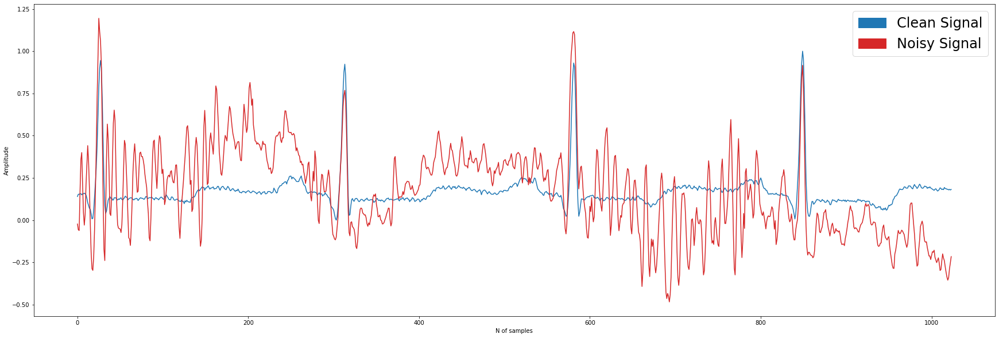

In [58]:
plotme(clean[10], origin[10], lg=['Clean Signal', 'Noisy Signal'], colors=['C0', 'C3'], ax_t=['Amplitude', 'N of samples'])

Dataset Train/Validation/Test split

In [26]:
test_samples = 300
test = {
    'clean': clean[-test_samples:],
    'origin': origin[-test_samples:],
    'recons': recons[-test_samples:],
}

val_samples = 300
val = {
    'clean': clean[-(test_samples + val_samples):-test_samples],
    'origin': origin[-(test_samples + val_samples):-test_samples],
    'recons': recons[-(test_samples + val_samples):-test_samples],
}

train = {
    'clean': clean[:-(test_samples + val_samples)],
    'origin': origin[:-(test_samples + val_samples)],
    'recons': recons[:-(test_samples + val_samples)],
}


Plotting a hundred signals at once just for fun

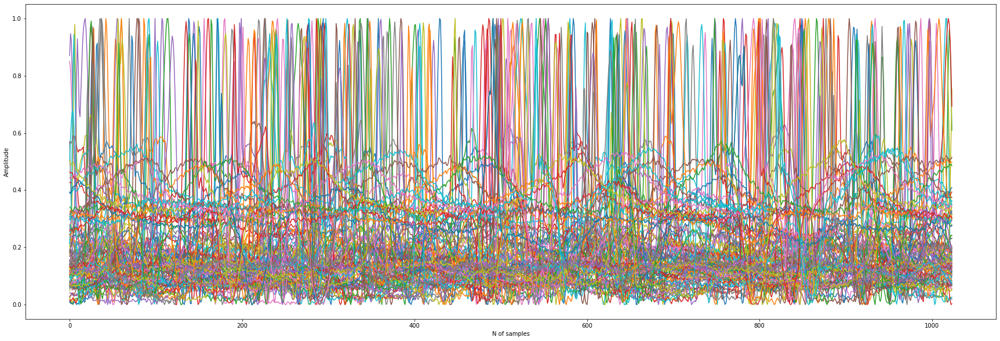

In [27]:
colors = [f'C{i}' for i in range(10)]

plt.figure(figsize=(30,10))
for i in range(100):
  plt.plot(train['clean'][i], color=colors[i % len(colors)])
plt.xlabel('N of samples')
plt.ylabel('Amplitude')
plt.show()

In [28]:
train['clean'].shape, val['clean'].shape, test['clean'].shape

((2280, 1024), (300, 1024), (300, 1024))

In [29]:
model = DAE()

lr = 5e-3
batch_size = 32
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=lr)

In [30]:
train_ds = SignalsDataset(train)
dl_train = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_ds = SignalsDataset(val)
dl_val = DataLoader(val_ds, batch_size=batch_size, shuffle=False)
test_ds = SignalsDataset(test)
dl_test = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

In [31]:
model = model.to(device)

In [32]:
train_fn_base(model, train=dl_train, valid=dl_val, opt=optimizer, loss_fn=loss_fn, epochs=100)

  0%|          | 0/72 [00:00<?, ?batch/s]

/usr/local/lib/python3.9/dist-packages/torch/nn/modules/conv.py:309: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at ../aten/src/ATen/native/Convolution.cpp:895.)
  return F.conv1d(input, weight, bias, self.stride,


  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 1:
MSE training loss: 0.6146817652301656
MSE validation loss: 0.1624446716159582
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 2:
MSE training loss: 0.1392415764534639
MSE validation loss: 0.333993399143219
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 3:
MSE training loss: 0.1674197186819381
MSE validation loss: 0.05262939166277647
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 4:
MSE training loss: 0.09684826237046057
MSE validation loss: 0.10934343002736568
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 5:
MSE training loss: 0.09101503083689345
MSE validation loss: 0.07761754654347897
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 6:
MSE training loss: 0.06872764328080747
MSE validation loss: 0.05830770060420036
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 7:
MSE training loss: 0.05955639931683739
MSE validation loss: 0.052981735207140446
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 8:
MSE training loss: 0.04911436637242635
MSE validation loss: 0.05214382223784923
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 9:
MSE training loss: 0.040783093569593296
MSE validation loss: 0.0430324450135231
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 10:
MSE training loss: 0.03950163214984867
MSE validation loss: 0.044683292508125305
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 11:
MSE training loss: 0.03855235636648205
MSE validation loss: 0.04018802922219038
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 12:
MSE training loss: 0.03568161206526889
MSE validation loss: 0.037427044659852984
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 13:
MSE training loss: 0.03833531593489978
MSE validation loss: 0.03803553394973278
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 14:
MSE training loss: 0.0350044635641906
MSE validation loss: 0.03945050109177828
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 15:
MSE training loss: 0.03638521755217678
MSE validation loss: 0.03883085791021586
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 16:
MSE training loss: 0.03296270671611031
MSE validation loss: 0.038374371454119684
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 17:
MSE training loss: 0.034500818182196885
MSE validation loss: 0.03624576106667519
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 18:
MSE training loss: 0.03333490869651238
MSE validation loss: 0.034106113202869895
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 19:
MSE training loss: 0.03252616167689363
MSE validation loss: 0.03753027636557817
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 20:
MSE training loss: 0.03071451003456281
MSE validation loss: 0.03153429087251425
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 21:
MSE training loss: 0.032122404857849084
MSE validation loss: 0.03263054639101028
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 22:
MSE training loss: 0.03037127609261208
MSE validation loss: 0.028933018818497656
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 23:
MSE training loss: 0.0288951039676451
MSE validation loss: 0.03617871552705765
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 24:
MSE training loss: 0.028779144295387797
MSE validation loss: 0.027793713100254535
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 25:
MSE training loss: 0.02790267015289929
MSE validation loss: 0.026961325854063033
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 26:
MSE training loss: 0.0271211173126681
MSE validation loss: 0.036416363157331946
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 27:
MSE training loss: 0.028388509940769937
MSE validation loss: 0.030110562779009344
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 28:
MSE training loss: 0.02659344153168301
MSE validation loss: 0.025676434487104417
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 29:
MSE training loss: 0.025280610114956897
MSE validation loss: 0.02499301768839359
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 30:
MSE training loss: 0.023968350556161668
MSE validation loss: 0.02226296914741397
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 31:
MSE training loss: 0.02458358351658616
MSE validation loss: 0.022496516723185776
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 32:
MSE training loss: 0.02294117551193469
MSE validation loss: 0.02490677386522293
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 33:
MSE training loss: 0.022811073965082567
MSE validation loss: 0.02264164388179779
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 34:
MSE training loss: 0.022055833496981196
MSE validation loss: 0.018933067470788954
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 35:
MSE training loss: 0.021209851605817676
MSE validation loss: 0.02272411584854126
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 36:
MSE training loss: 0.01968832270035313
MSE validation loss: 0.02092462107539177
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 37:
MSE training loss: 0.01930213471253713
MSE validation loss: 0.0213248030282557
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 38:
MSE training loss: 0.01915514108259231
MSE validation loss: 0.018226320296525954
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 39:
MSE training loss: 0.01846294401265267
MSE validation loss: 0.016827731672674418
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 40:
MSE training loss: 0.01759452080457575
MSE validation loss: 0.018718004412949085
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 41:
MSE training loss: 0.017125977914676897
MSE validation loss: 0.01699495632201433
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 42:
MSE training loss: 0.015915598396936223
MSE validation loss: 0.014746743813157081
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 43:
MSE training loss: 0.016649508396060102
MSE validation loss: 0.014053970761597156
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 44:
MSE training loss: 0.015277630339066187
MSE validation loss: 0.018347131460905074
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 45:
MSE training loss: 0.015026377332914207
MSE validation loss: 0.01575845880433917
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 46:
MSE training loss: 0.015831895638257265
MSE validation loss: 0.021417290717363358
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 47:
MSE training loss: 0.014871298206142254
MSE validation loss: 0.013249207194894553
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 48:
MSE training loss: 0.014560091309249401
MSE validation loss: 0.012920071743428707
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 49:
MSE training loss: 0.014368632122770779
MSE validation loss: 0.012347727548331022
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 50:
MSE training loss: 0.012798855909042887
MSE validation loss: 0.010747915878891946
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 51:
MSE training loss: 0.013554078410379589
MSE validation loss: 0.011352756805717946
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 52:
MSE training loss: 0.01296809954672224
MSE validation loss: 0.012304211733862758
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 53:
MSE training loss: 0.012467393405838974
MSE validation loss: 0.009824650641530753
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 54:
MSE training loss: 0.01250277936924249
MSE validation loss: 0.010853190161287784
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 55:
MSE training loss: 0.012332960743353598
MSE validation loss: 0.011344531690701843
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 56:
MSE training loss: 0.01204512060050749
MSE validation loss: 0.009913578163832426
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 57:
MSE training loss: 0.012067359768682055
MSE validation loss: 0.012003697687759995
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 58:
MSE training loss: 0.011800105360129641
MSE validation loss: 0.009921527234837413
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 59:
MSE training loss: 0.010740573052316904
MSE validation loss: 0.0119206961710006
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 60:
MSE training loss: 0.011783489711686142
MSE validation loss: 0.009118026308715343
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 61:
MSE training loss: 0.010691187732542554
MSE validation loss: 0.01177890608087182
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 62:
MSE training loss: 0.011505582098228237
MSE validation loss: 0.010766526684165001
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 63:
MSE training loss: 0.01054720584458361
MSE validation loss: 0.00838852566666901
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 64:
MSE training loss: 0.010716517766316732
MSE validation loss: 0.008131026569753886
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 65:
MSE training loss: 0.010315509862266481
MSE validation loss: 0.007518690545111895
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 66:
MSE training loss: 0.010322482021163322
MSE validation loss: 0.015560862421989442
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 67:
MSE training loss: 0.010824454223944081
MSE validation loss: 0.008308794209733605
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 68:
MSE training loss: 0.010109398720992936
MSE validation loss: 0.007106115808710456
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 69:
MSE training loss: 0.010387141981886493
MSE validation loss: 0.008903545932844282
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 70:
MSE training loss: 0.010643741542783877
MSE validation loss: 0.009143551392480732
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 71:
MSE training loss: 0.009877560078166425
MSE validation loss: 0.010845712432637811
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 72:
MSE training loss: 0.009452351860495077
MSE validation loss: 0.00881349598057568
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 73:
MSE training loss: 0.0101546634040359
MSE validation loss: 0.008783627580851317
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 74:
MSE training loss: 0.009464143665455695
MSE validation loss: 0.006932686688378454
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 75:
MSE training loss: 0.008980538346804678
MSE validation loss: 0.007336279330775142
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 76:
MSE training loss: 0.009308173068954298
MSE validation loss: 0.0069356091320514675
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 77:
MSE training loss: 0.008791312898716165
MSE validation loss: 0.00614366764202714
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 78:
MSE training loss: 0.009931137080356065
MSE validation loss: 0.009442915953695775
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 79:
MSE training loss: 0.009146872513358377
MSE validation loss: 0.007892416045069694
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 80:
MSE training loss: 0.009834904197810425
MSE validation loss: 0.012643780279904603
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 81:
MSE training loss: 0.010496259117240293
MSE validation loss: 0.010109803872182965
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 82:
MSE training loss: 0.009554137230022915
MSE validation loss: 0.008790228702127933
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 83:
MSE training loss: 0.01038698471772174
MSE validation loss: 0.006708645913749933
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 84:
MSE training loss: 0.008800494361720566
MSE validation loss: 0.0060579324373975394
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 85:
MSE training loss: 0.008512378857833229
MSE validation loss: 0.009194285748526454
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 86:
MSE training loss: 0.008119207658132331
MSE validation loss: 0.005871822638437152
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 87:
MSE training loss: 0.008220413544525703
MSE validation loss: 0.0060571541776880625
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 88:
MSE training loss: 0.009179569936046997
MSE validation loss: 0.005861632013693452
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 89:
MSE training loss: 0.008898790000886139
MSE validation loss: 0.00630750220734626
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 90:
MSE training loss: 0.008278313409795778
MSE validation loss: 0.0064444740302860735
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 91:
MSE training loss: 0.008454781879360477
MSE validation loss: 0.006030758074484765
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 92:
MSE training loss: 0.008520309554619921
MSE validation loss: 0.007098763296380639
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 93:
MSE training loss: 0.008837361173290346
MSE validation loss: 0.00585112851113081
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 94:
MSE training loss: 0.007914082703387572
MSE validation loss: 0.006578539684414864
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 95:
MSE training loss: 0.0076521177284626495
MSE validation loss: 0.0065506486222147945
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 96:
MSE training loss: 0.00776607948096676
MSE validation loss: 0.00554668391123414
MSE reconstruc loss: 0.010975828813388943
found better valid loss... saving model...


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 97:
MSE training loss: 0.008362268563359976
MSE validation loss: 0.007570993527770043
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 98:
MSE training loss: 0.007893462102704992
MSE validation loss: 0.005596500704996288
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 99:
MSE training loss: 0.007661055288432787
MSE validation loss: 0.006158566474914551
MSE reconstruc loss: 0.010975828813388943


  0%|          | 0/72 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 100:
MSE training loss: 0.00769814535871976
MSE validation loss: 0.006327514816075563
MSE reconstruc loss: 0.010975828813388943


In [36]:
best_model = DAE()
best_model.load_state_dict(torch.load('best.pth'))
best_model.eval()
best_model = best_model.to(device)

In [37]:
out_full = best_model(train_ds[:]['noisy'].to(device)).detach().cpu()
out_full.shape

torch.Size([2280, 1, 1024])

In [48]:
score = ((train_ds[:]['clean'] - out_full) ** 2).mean(axis=-1)[:,0]

In [49]:
score.argsort()

tensor([2230, 2218, 1272,  ..., 1531, 1807,  847])

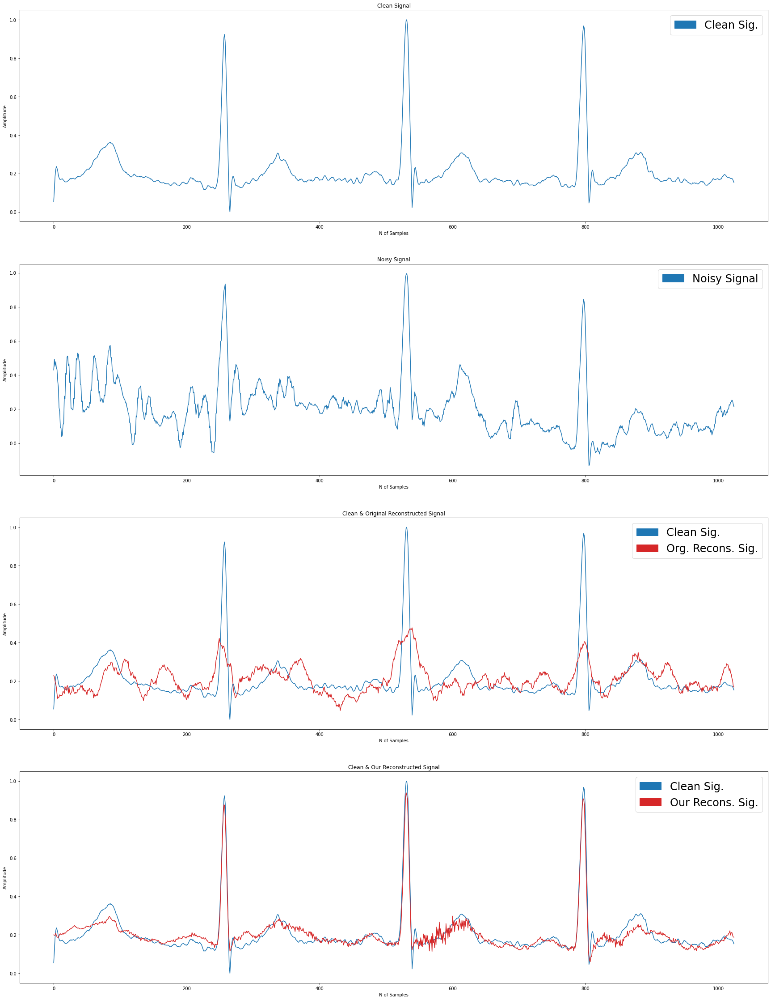

In [67]:
index = 2230
sample = train_ds[index]
s_clean = sample['clean'][0]
s_noisy = sample['noisy'][0]
s_recon = sample['recons'][0]
output = out_full[index][0]
plot_report(s_clean, s_noisy, s_recon, output)

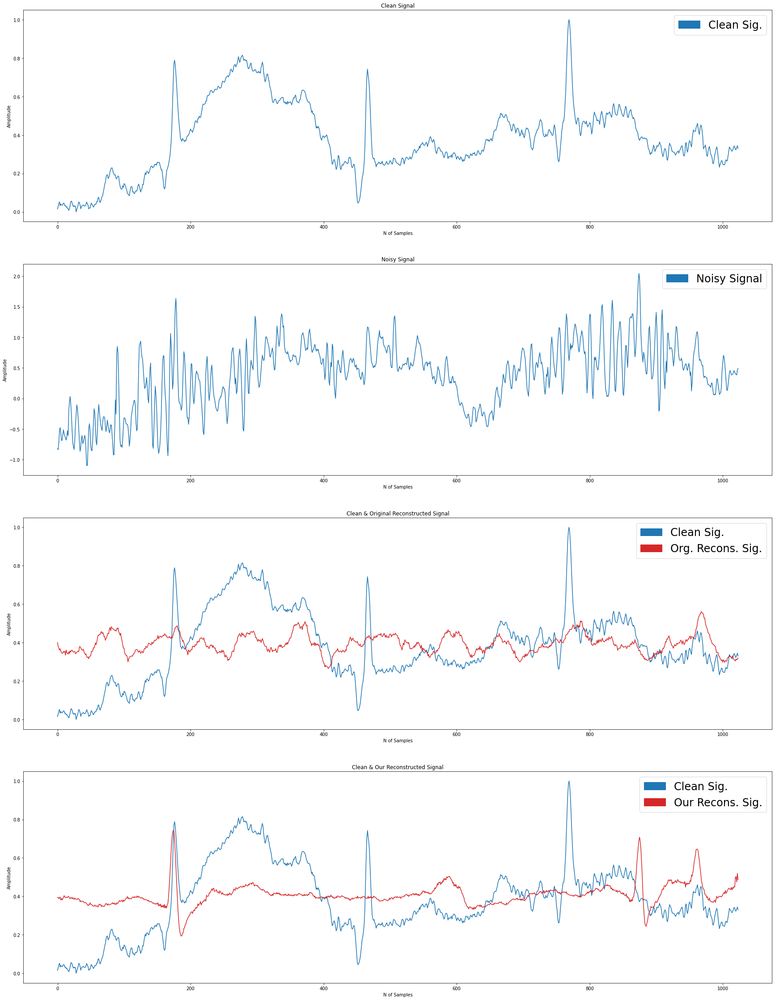

In [68]:
index = 847
sample = train_ds[index]
s_clean = sample['clean'][0]
s_noisy = sample['noisy'][0]
s_recon = sample['recons'][0]
output = out_full[index][0]
plot_report(s_clean, s_noisy, s_recon, output)

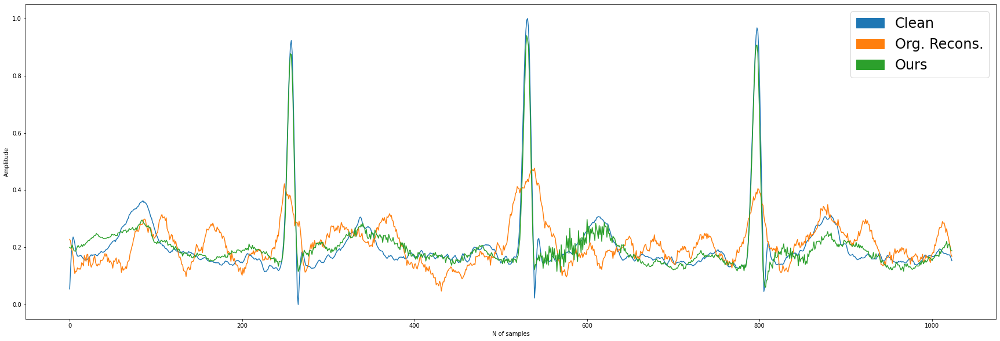

In [71]:
index = 2230

sample = train_ds[index]
s_clean = sample['clean'][0]
s_recon = sample['recons'][0]
output = out_full[index][0]

plotme(s_clean, s_recon, output, lg=['Clean', 'Org. Recons.', 'Ours'], colors=['C0', 'C1', 'C2'])

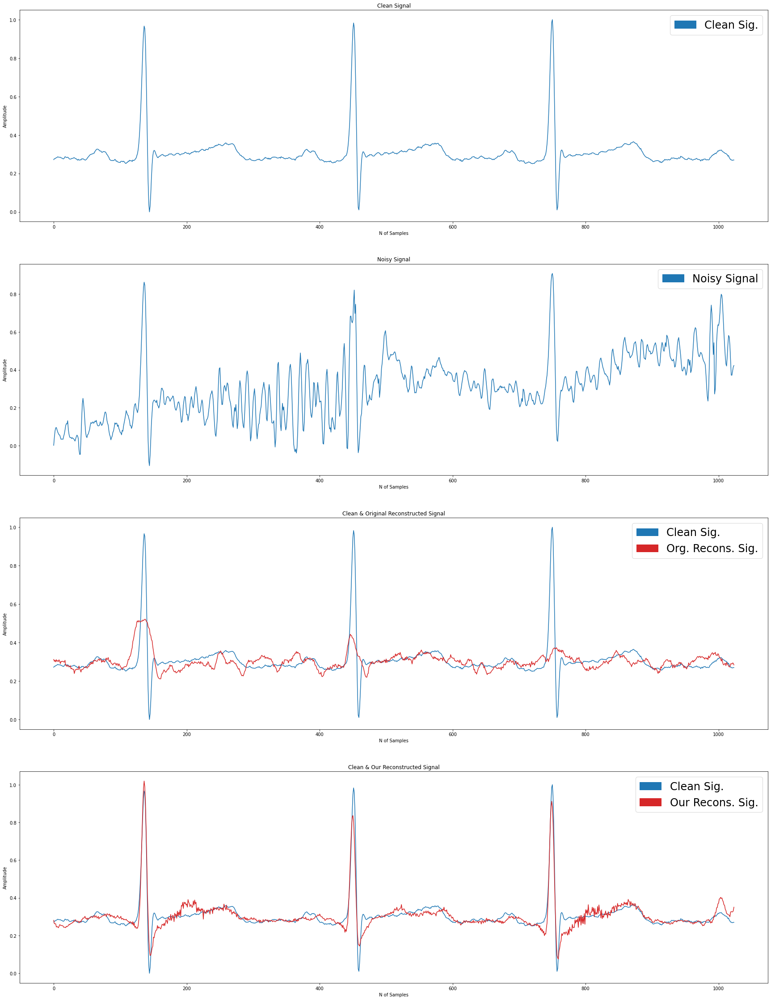

In [72]:
index = 2218
sample = train_ds[index]
s_clean = sample['clean'][0]
s_noisy = sample['noisy'][0]
s_recon = sample['recons'][0]
output = out_full[index][0]
plot_report(s_clean, s_noisy, s_recon, output)

# Training with our SNR based generated signals

In [9]:
from itertools import product

SNRs = [-2.5, -1, 0, 2.5, 3, 5, 7, 7.5]

my_clean = read_data('exp_data/clean.mat')['ecg']

noisy = [[add_noise(my_clean[i], snr) for snr in SNRs] for i in range(my_clean.shape[0])]

In [10]:
noisy_arr = np.array(noisy)

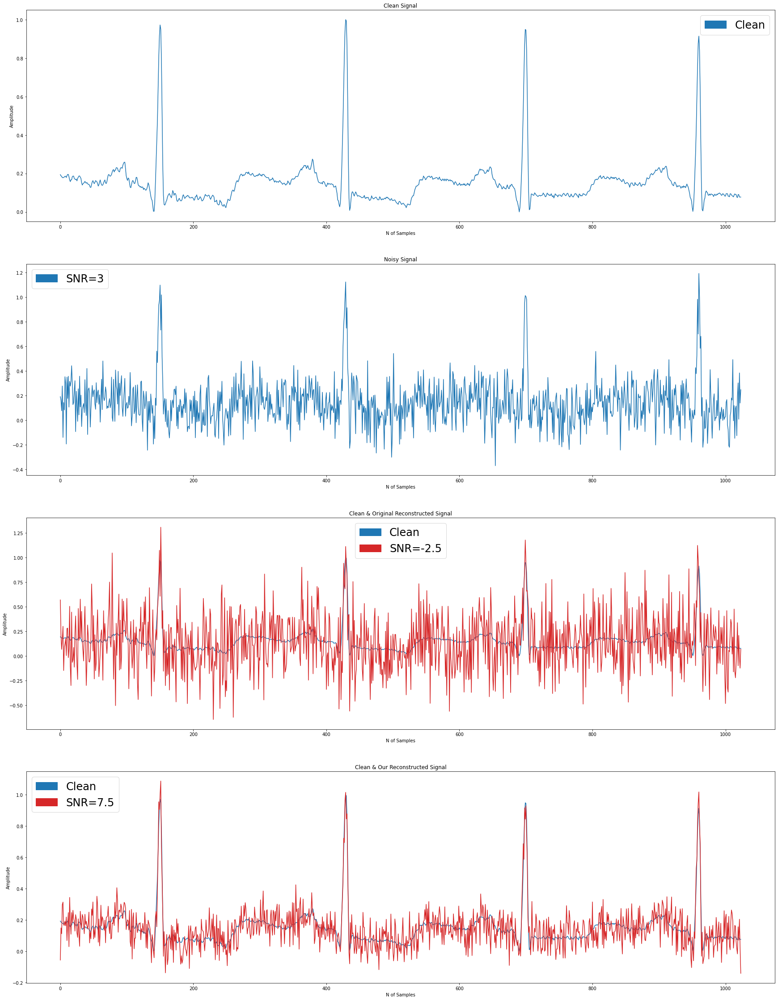

In [11]:
plot_report(
    my_clean[0], 
    noisy_arr[0][4], 
    noisy_arr[0][0], 
    noisy_arr[0][-1], 
    lg=[
        'Clean',
        'SNR=3',
        'SNR=-2.5',
        'SNR=7.5',
    ]
)

In [12]:
split = 300

dd_train = {
    'clean': my_clean[:-split-split],
    'noisy': noisy_arr[:-split-split],
}

dd_val = {
    'clean': my_clean[-split-split:-split],
    'noisy': noisy_arr[-split-split:-split],
}

dd_test = {
    'clean': my_clean[-split:],
    'noisy': noisy_arr[-split:],
}

In [13]:
new_model = DAE()

lr = 5e-3
batch_size = 32
loss_fn = nn.MSELoss()
optimizer = optim.Adam(new_model.parameters(), lr=lr)

In [14]:
train_ds = OurSignalsDataset(dd_train, SNRs)
dl_train = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_ds = OurSignalsDataset(dd_val, SNRs)
dl_val = DataLoader(val_ds, batch_size=batch_size, shuffle=False)
test_ds = OurSignalsDataset(dd_test, SNRs)
dl_test = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

In [108]:
new_model = new_model.to(device)

In [109]:
report = train_fn_plus(new_model, train=dl_train, valid=dl_val, opt=optimizer, loss_fn=loss_fn, epochs=20)

  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 1:
MSE training loss: 0.14478594115036622
MSE validation loss: 0.043743976602951685
found better valid loss... saving model...


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 2:
MSE training loss: 0.028845100657066754
MSE validation loss: 0.027647675822178523
found better valid loss... saving model...


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 3:
MSE training loss: 0.018418321220955828
MSE validation loss: 0.016610454532007376
found better valid loss... saving model...


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 4:
MSE training loss: 0.012640779428674202
MSE validation loss: 0.01062228886410594
found better valid loss... saving model...


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 5:
MSE training loss: 0.009564520227477738
MSE validation loss: 0.008116387218857804
found better valid loss... saving model...


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 6:
MSE training loss: 0.008322229365442406
MSE validation loss: 0.006323092468082905
found better valid loss... saving model...


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 7:
MSE training loss: 0.007429229025320526
MSE validation loss: 0.0061461571635057525
found better valid loss... saving model...


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 8:
MSE training loss: 0.006741451217155707
MSE validation loss: 0.005386153565098842
found better valid loss... saving model...


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 9:
MSE training loss: 0.006597430911732086
MSE validation loss: 0.008683890067040921


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 10:
MSE training loss: 0.006188514523142785
MSE validation loss: 0.0054550263533989585


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 11:
MSE training loss: 0.00582029929940115
MSE validation loss: 0.006944246444230279


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 12:
MSE training loss: 0.005680265271497008
MSE validation loss: 0.006424557324498892


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 13:
MSE training loss: 0.0055354598435785685
MSE validation loss: 0.004726117714308202
found better valid loss... saving model...


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 14:
MSE training loss: 0.005314471441925618
MSE validation loss: 0.005004901348923643


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 15:
MSE training loss: 0.005007810701550752
MSE validation loss: 0.004714231596638759
found better valid loss... saving model...


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 16:
MSE training loss: 0.004962851187590052
MSE validation loss: 0.003913502286498745
found better valid loss... saving model...


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 17:
MSE training loss: 0.004757203203380892
MSE validation loss: 0.005690617213646571


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 18:
MSE training loss: 0.00449848088983185
MSE validation loss: 0.004505551345646381


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 19:
MSE training loss: 0.004327610504339661
MSE validation loss: 0.0037170865712687373
found better valid loss... saving model...


  0%|          | 0/570 [00:00<?, ?batch/s]

  0%|          | 0/75 [00:00<?, ?batch/s]

epoch 20:
MSE training loss: 0.004300568686602147
MSE validation loss: 0.004004304000797371


In [15]:
new_model_saved = DAE()
new_model_saved.load_state_dict(torch.load('new_best.pth'))
new_model_saved.eval()
new_model_saved = new_model_saved.to(device)

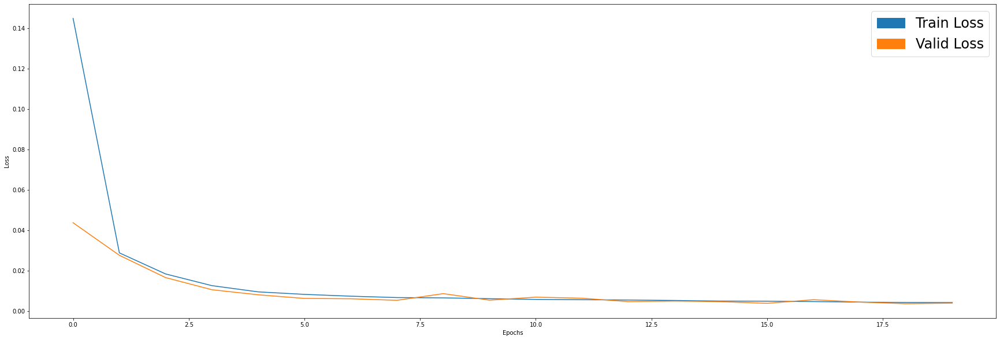

In [111]:
plotme(report['train_loss'], report['val_loss'], ax_t=['Loss', 'Epochs'], colors=['C0', 'C1'], lg=['Train Loss', 'Valid Loss'])

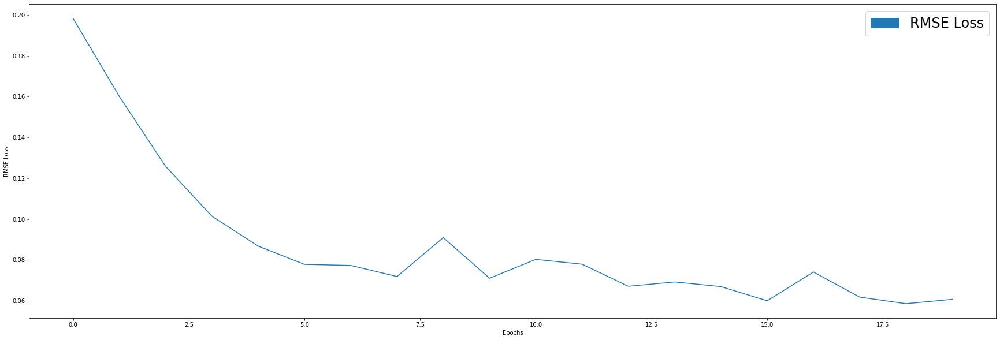

In [112]:
plotme(report['rmse_loss'], ax_t=['RMSE Loss', 'Epochs'], colors=['C0'], lg=['RMSE Loss'])

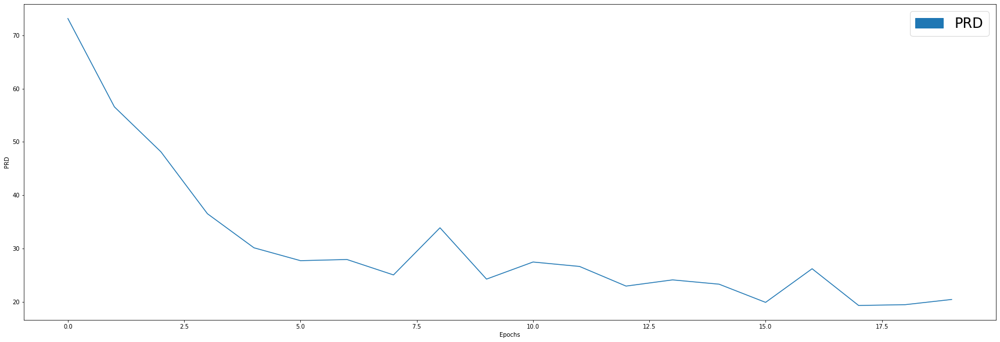

In [113]:
plotme(report['prd'], ax_t=['PRD', 'Epochs'], colors=['C0'], lg=['PRD'])

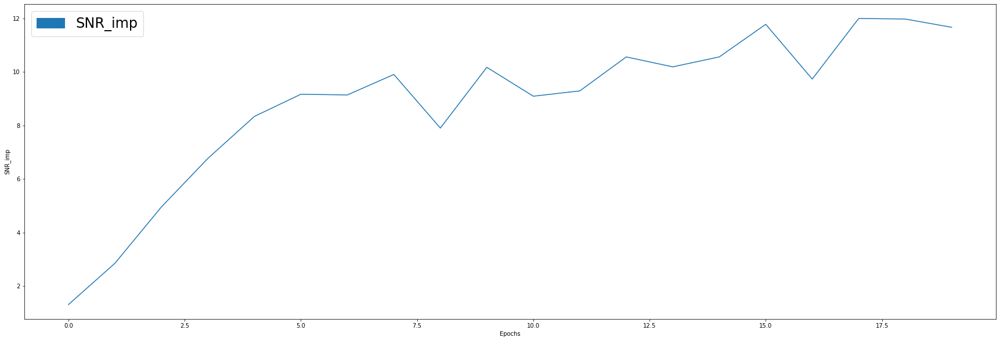

In [114]:
plotme(report['snr_imp'], ax_t=['SNR_imp', 'Epochs'], colors=['C0'], lg=['SNR_imp'])

In [26]:
dd_train['clean'].shape, dd_train['noisy'].shape 

((2280, 1024), (2280, 8, 1024))

In [30]:
clean_perm, noisy_perm = torch.tensor(dd_train['clean']), torch.tensor(dd_train['noisy']).permute([1,0,2])
clean_perm, noisy_perm = clean_perm.unsqueeze(1), noisy_perm.unsqueeze(2)
clean_perm.shape, noisy_perm.shape

(torch.Size([2280, 1, 1024]), torch.Size([8, 2280, 1, 1024]))

In [32]:
noisy_perm[0,:,0,:].shape

torch.Size([2280, 1024])

In [38]:
snr_res = {}
for i in range(len(SNRs)):
  output = new_model_saved(torch.tensor(noisy_perm[i], dtype=torch.float32).to(device)).detach().cpu()

  snr_in = calc_snr_batch(clean_perm, noisy_perm[i])
  snr_out = calc_snr_batch(clean_perm, output)

  snr_imp = snr_out - snr_in

  snr_res[str(SNRs[i])] = snr_imp.item()

snr_res

<ipython-input-38-2d92004335cc>:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  output = new_model_saved(torch.tensor(noisy_perm[i], dtype=torch.float32).to(device)).detach().cpu()


{'-2.5': 15.35752204972891,
 '-1': 14.695428931454703,
 '0': 14.196215620674646,
 '2.5': 12.763890908454076,
 '3': 12.40752981318512,
 '5': 10.953768485358374,
 '7': 9.293191990586386,
 '7.5': 8.874830368340866}

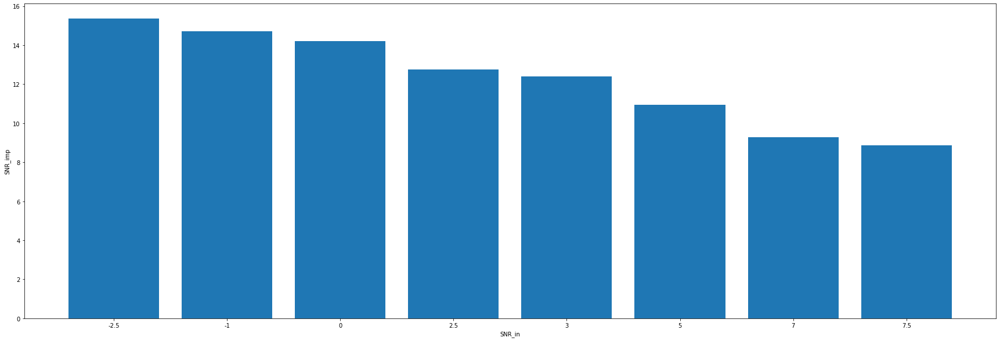

In [39]:
plt.figure(figsize=(30,10))
plt.bar(list(snr_res.keys()), list(snr_res.values()))
plt.xlabel('SNR_in')
plt.ylabel('SNR_imp')
plt.show()

In [41]:
s_noisy.to(device).unsqueeze(0).shape

torch.Size([1, 1024])

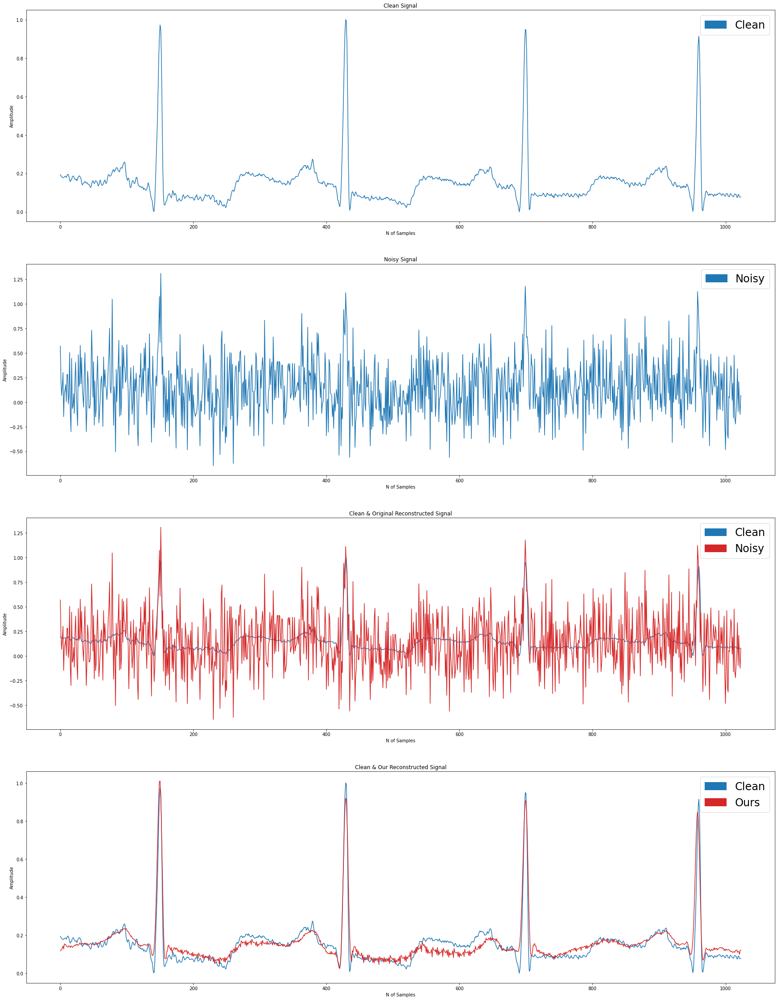

In [45]:
index = 0
sample = train_ds[index]
s_clean = sample['clean'][0]
s_noisy = sample['noisy'][0]
output = new_model_saved(s_noisy.to(device).unsqueeze(0).unsqueeze(0))[0][0].detach().cpu()
plot_report(s_clean, s_noisy, s_noisy, output, lg=['Clean', 'Noisy', 'Noisy', 'Ours'])

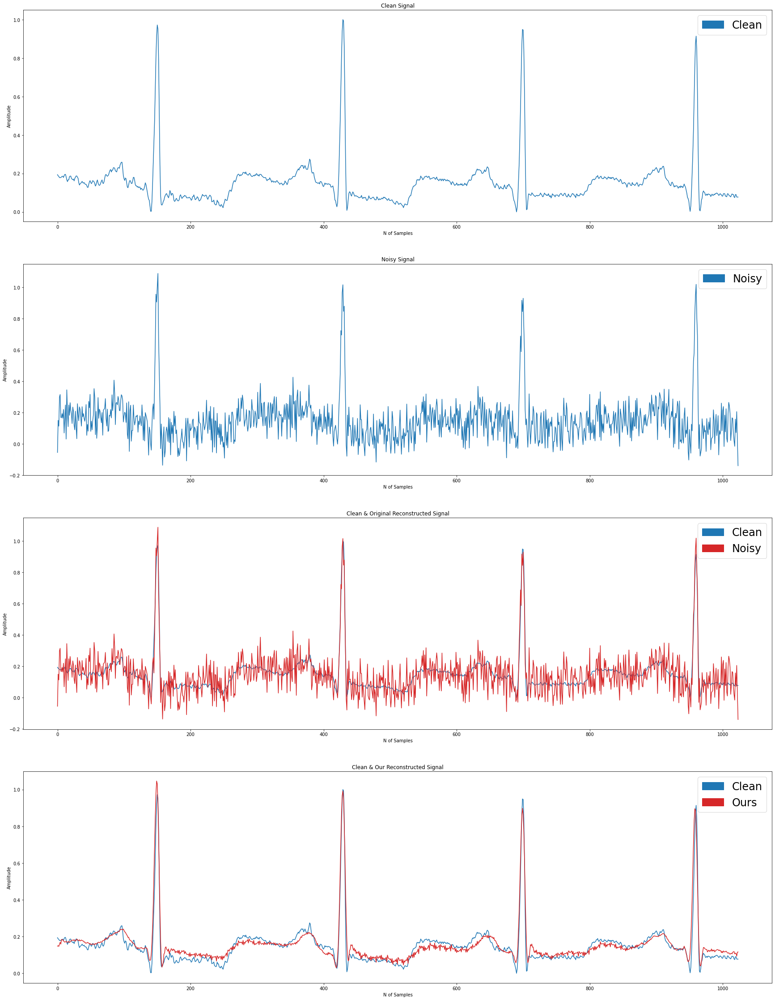

In [46]:
index = 7
sample = train_ds[index]
s_clean = sample['clean'][0]
s_noisy = sample['noisy'][0]
output = new_model_saved(s_noisy.to(device).unsqueeze(0).unsqueeze(0))[0][0].detach().cpu()
plot_report(s_clean, s_noisy, s_noisy, output, lg=['Clean', 'Noisy', 'Noisy', 'Ours'])

# KOUAME DATASET

In [52]:
clean1 = read_data('PCG/S1_Clean.mat')['PCG']
clean2 = read_data('PCG/S2_Clean.mat')['PCG']
clean3 = read_data('PCG/S3_Clean.mat')['PCG']

noisy1 = read_data('PCG/S1.mat')['x']
noisy2 = read_data('PCG/S2.mat')['x']
noisy3 = read_data('PCG/S3.mat')['x']

In [53]:
clean1.shape, clean2.shape, clean3.shape

((60151, 1), (45001, 1), (12801, 1))

In [54]:
noisy1.shape, noisy2.shape, noisy3.shape

((60000, 1), (45000, 1), (12000, 1))

In [55]:
clean1 = clean1[:50000]
clean2 = clean2[:40000]
clean3 = clean3[:10000]

noisy1 = noisy1[:50000]
noisy2 = noisy2[:40000]
noisy3 = noisy3[:10000]

In [56]:
clean = np.concatenate([clean1, clean2, clean3])
noisy = np.concatenate([noisy1, noisy2, noisy3])
clean.shape, noisy.shape

((100000, 1), (100000, 1))

In [57]:
ds_dict = {
    'clean': clean,
    'noisy': noisy,
}

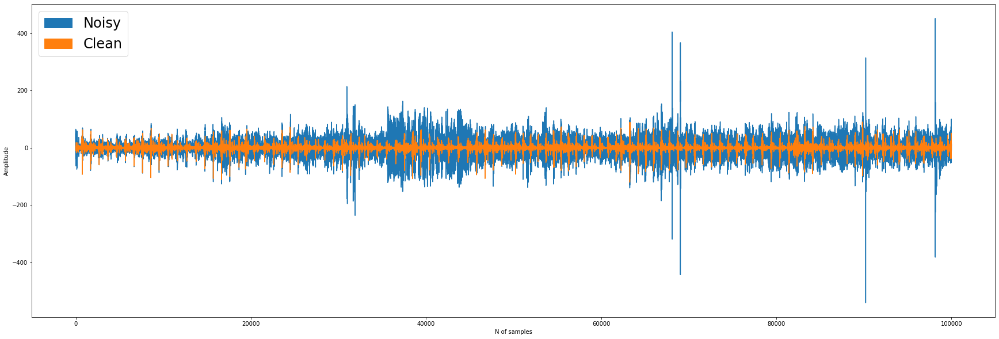

In [58]:
plotme(ds_dict['noisy'], ds_dict['clean'], lg=['Noisy', 'Clean'])

In [59]:
ds_dict['clean'] = ds_dict['clean'] / ds_dict['clean'].std()
ds_dict['noisy'] = ds_dict['noisy'] / ds_dict['noisy'].std()

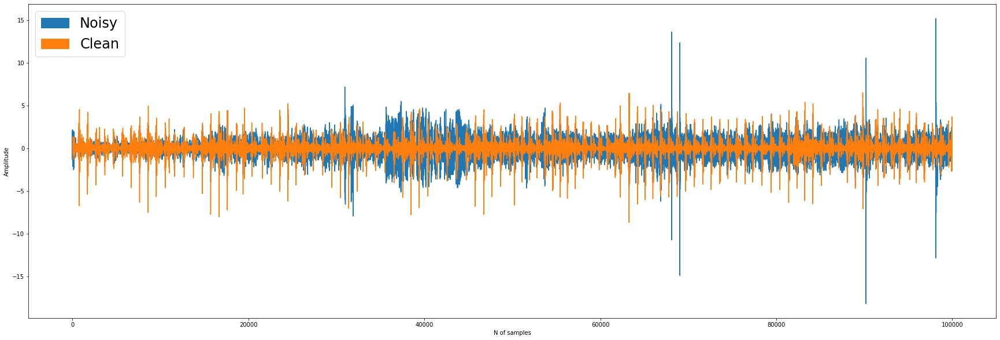

In [60]:
plotme(ds_dict['noisy'], ds_dict['clean'], lg=['Noisy', 'Clean'])

In [62]:
indexer = np.arange(1024)[None, :] + 32*np.arange(3000)[:, None]
clean_indexed = ds_dict['clean'][indexer][:,:,0]
noisy_indexed = ds_dict['noisy'][indexer][:,:,0]

In [61]:
kouame_model = DAE()

lr = 5e-3
batch_size = 32
loss_fn = nn.MSELoss()
optimizer = optim.Adam(kouame_model.parameters(), lr=lr)

In [63]:
clean_indexed.shape

(3000, 1024)

In [64]:
split = 300

dd_train = {
    'clean': clean_indexed[:-split-split],
    'noisy': noisy_indexed[:-split-split],
}

dd_val = {
    'clean': clean_indexed[-split-split:-split],
    'noisy': noisy_indexed[-split-split:-split],
}

dd_test = {
    'clean': clean_indexed[-split:],
    'noisy': noisy_indexed[-split:],
}

In [65]:
train_ds = KouameDataset(dd_train)
dl_train = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_ds = KouameDataset(dd_val)
dl_val = DataLoader(val_ds, batch_size=batch_size, shuffle=False)
test_ds = KouameDataset(dd_test)
dl_test = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

In [66]:
kouame_model = kouame_model.to(device)

In [67]:
kouame_report = train_fn_kouame(kouame_model, train=dl_train, valid=dl_val, opt=optimizer, loss_fn=loss_fn, epochs=100)

  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 1:
MSE training loss: 1.7795023544629416
MSE validation loss: 1.1691887438297273
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 2:
MSE training loss: 1.052404102484385
MSE validation loss: 1.0599989771842957
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 3:
MSE training loss: 1.0276174267133078
MSE validation loss: 1.0582251697778702
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 4:
MSE training loss: 1.0215570322672527
MSE validation loss: 1.0584160804748535


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 5:
MSE training loss: 1.014584464232127
MSE validation loss: 1.059597623348236


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 6:
MSE training loss: 1.0075949732462566
MSE validation loss: 1.0578995406627656
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 7:
MSE training loss: 1.0078711334864299
MSE validation loss: 1.0581817328929901


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 8:
MSE training loss: 1.0070721872647603
MSE validation loss: 1.057828712463379
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 9:
MSE training loss: 1.0002088522911072
MSE validation loss: 1.0580494165420533


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 10:
MSE training loss: 1.0010706321398417
MSE validation loss: 1.058123230934143


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 11:
MSE training loss: 0.9974735895792644
MSE validation loss: 1.0577567607164382
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 12:
MSE training loss: 0.9960089914004008
MSE validation loss: 1.0577653110027314


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 13:
MSE training loss: 0.9967603015899659
MSE validation loss: 1.057907572388649


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 14:
MSE training loss: 0.9947737089792887
MSE validation loss: 1.0580474525690078


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 15:
MSE training loss: 0.9930652658144633
MSE validation loss: 1.0579365849494935


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 16:
MSE training loss: 0.9942510318756104
MSE validation loss: 1.058310303092003


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 17:
MSE training loss: 0.9931554428736369
MSE validation loss: 1.0576979994773865
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 18:
MSE training loss: 0.9928431280454
MSE validation loss: 1.0576726734638213
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 19:
MSE training loss: 0.9907604058583578
MSE validation loss: 1.057739970088005


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 20:
MSE training loss: 1.008493484656016
MSE validation loss: 1.0610631287097931


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 21:
MSE training loss: 1.0013178205490112
MSE validation loss: 1.0581473261117935


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 22:
MSE training loss: 1.0024006001154582
MSE validation loss: 1.05825035572052


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 23:
MSE training loss: 0.9903947313626608
MSE validation loss: 1.0577535569667815


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 24:
MSE training loss: 0.9903390439351399
MSE validation loss: 1.0581797003746032


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 25:
MSE training loss: 0.988269427617391
MSE validation loss: 1.05764182806015
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 26:
MSE training loss: 0.9876824831962585
MSE validation loss: 1.0576308876276017
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 27:
MSE training loss: 0.9909272734324137
MSE validation loss: 1.057633924484253


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 28:
MSE training loss: 0.9879328870773315
MSE validation loss: 1.0576033622026444
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 29:
MSE training loss: 0.9876407337188721
MSE validation loss: 1.057605391740799


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 30:
MSE training loss: 0.9879564730326335
MSE validation loss: 1.0576525837183


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 31:
MSE training loss: 0.9890465307235717
MSE validation loss: 1.0576174914836884


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 32:
MSE training loss: 0.9876125144958496
MSE validation loss: 1.0576105296611786


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 33:
MSE training loss: 0.9875208799044292
MSE validation loss: 1.0576021134853364
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 34:
MSE training loss: 0.9875356650352478
MSE validation loss: 1.0576063871383667


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 35:
MSE training loss: 0.9872741508483887
MSE validation loss: 1.057595932483673
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 36:
MSE training loss: 0.9877183373769124
MSE validation loss: 1.0576370298862456


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 37:
MSE training loss: 0.9882271488507589
MSE validation loss: 1.0576323956251144


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 38:
MSE training loss: 0.9880439917246501
MSE validation loss: 1.0576216012239457


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 39:
MSE training loss: 0.9875300606091817
MSE validation loss: 1.057597804069519


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 40:
MSE training loss: 0.9890763179461162
MSE validation loss: 1.0576189517974854


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 41:
MSE training loss: 0.9871451743443806
MSE validation loss: 1.0576407730579376


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 42:
MSE training loss: 0.9869463078180949
MSE validation loss: 1.0577540636062621


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 43:
MSE training loss: 0.9876305063565572
MSE validation loss: 1.0577425181865692


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 44:
MSE training loss: 0.9866927814483643
MSE validation loss: 1.0578099638223648


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 45:
MSE training loss: 0.9866445151964823
MSE validation loss: 1.0577572584152222


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 46:
MSE training loss: 0.9859791835149129
MSE validation loss: 1.0578566551208497


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 47:
MSE training loss: 0.985305958588918
MSE validation loss: 1.0578094750642777


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 48:
MSE training loss: 0.9840181843439738
MSE validation loss: 1.058106291294098


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 49:
MSE training loss: 0.9809381453196208
MSE validation loss: 1.05757936835289
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 50:
MSE training loss: 0.9641871531804402
MSE validation loss: 1.0553687632083892
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 51:
MSE training loss: 0.9362803355852762
MSE validation loss: 1.0458944112062454
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 52:
MSE training loss: 0.7358950606981913
MSE validation loss: 0.5665389060974121
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 53:
MSE training loss: 0.47918198386828104
MSE validation loss: 0.5589293271303177
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 54:
MSE training loss: 0.42540810028711956
MSE validation loss: 0.5140815034508706
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 55:
MSE training loss: 0.39336256543795267
MSE validation loss: 0.4981047257781029
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 56:
MSE training loss: 0.3739397704601288
MSE validation loss: 0.5113469392061234


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 57:
MSE training loss: 0.35945436636606853
MSE validation loss: 0.5138487040996551


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 58:
MSE training loss: 0.34769715666770934
MSE validation loss: 0.5030685424804687


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 59:
MSE training loss: 0.33685833811759947
MSE validation loss: 0.5068693593144417


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 60:
MSE training loss: 0.331737140417099
MSE validation loss: 0.5058769255876541


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 61:
MSE training loss: 0.3250941542784373
MSE validation loss: 0.4896216496825218
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 62:
MSE training loss: 0.315645879705747
MSE validation loss: 0.49312581717967985


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 63:
MSE training loss: 0.3114809886614482
MSE validation loss: 0.49416901767253874


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 64:
MSE training loss: 0.3096296691894531
MSE validation loss: 0.49153767675161364


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 65:
MSE training loss: 0.3046578760941823
MSE validation loss: 0.48415062129497527
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 66:
MSE training loss: 0.3015514439344406
MSE validation loss: 0.49048116654157636


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 67:
MSE training loss: 0.2987888874610265
MSE validation loss: 0.5072106033563614


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 68:
MSE training loss: 0.296852506796519
MSE validation loss: 0.48053206205368043
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 69:
MSE training loss: 0.2942942488193512
MSE validation loss: 0.48618562072515487


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 70:
MSE training loss: 0.2926092191537221
MSE validation loss: 0.4905384063720703


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 71:
MSE training loss: 0.29112622161706286
MSE validation loss: 0.4851697489619255


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 72:
MSE training loss: 0.28786273996035255
MSE validation loss: 0.48640830516815187


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 73:
MSE training loss: 0.28684989412625633
MSE validation loss: 0.4816132754087448


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 74:
MSE training loss: 0.2848195433616638
MSE validation loss: 0.49035282582044604


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 75:
MSE training loss: 0.28412638425827025
MSE validation loss: 0.4930820673704147


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 76:
MSE training loss: 0.2832912077506383
MSE validation loss: 0.48895568400621414


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 77:
MSE training loss: 0.28251216451327005
MSE validation loss: 0.4839430034160614


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 78:
MSE training loss: 0.2809554127852122
MSE validation loss: 0.48482927978038787


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 79:
MSE training loss: 0.2794539338350296
MSE validation loss: 0.4931748703122139


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 80:
MSE training loss: 0.2769520302613576
MSE validation loss: 0.4896361276507378


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 81:
MSE training loss: 0.2771060347557068
MSE validation loss: 0.5032786875963211


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 82:
MSE training loss: 0.2786026014884313
MSE validation loss: 0.4791337221860886
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 83:
MSE training loss: 0.2761043300231298
MSE validation loss: 0.4811811625957489


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 84:
MSE training loss: 0.2743647356828054
MSE validation loss: 0.4793120965361595


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 85:
MSE training loss: 0.272753480275472
MSE validation loss: 0.49092626869678496


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 86:
MSE training loss: 0.27196667750676473
MSE validation loss: 0.4813832461833954


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 87:
MSE training loss: 0.2708075813452403
MSE validation loss: 0.4835592985153198


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 88:
MSE training loss: 0.27088899513085685
MSE validation loss: 0.47962740659713743


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 89:
MSE training loss: 0.2710030122598012
MSE validation loss: 0.48277522027492525


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 90:
MSE training loss: 0.2675750716527303
MSE validation loss: 0.48623263239860537


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 91:
MSE training loss: 0.26837311844031014
MSE validation loss: 0.48195351362228395


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 92:
MSE training loss: 0.2702074408531189
MSE validation loss: 0.48917506337165834


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 93:
MSE training loss: 0.2678909965356191
MSE validation loss: 0.48892090320587156


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 94:
MSE training loss: 0.2669318058093389
MSE validation loss: 0.48339690268039703


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 95:
MSE training loss: 0.26518241266409553
MSE validation loss: 0.484750597178936


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 96:
MSE training loss: 0.26694983303546904
MSE validation loss: 0.48304622173309325


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 97:
MSE training loss: 0.26484389205773673
MSE validation loss: 0.47745573818683623
found better valid loss... saving model...


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 98:
MSE training loss: 0.2651779059569041
MSE validation loss: 0.4911324709653854


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 99:
MSE training loss: 0.2635116237401962
MSE validation loss: 0.47896634191274645


  0%|          | 0/75 [00:00<?, ?batch/s]

  0%|          | 0/10 [00:00<?, ?batch/s]

epoch 100:
MSE training loss: 0.26394781827926633
MSE validation loss: 0.48749057948589325


In [76]:
kouame_model_saved = DAE()
kouame_model_saved.load_state_dict(torch.load('kouame_best.pth'))
kouame_model_saved.eval()
kouame_model_saved = kouame_model_saved.to(device)

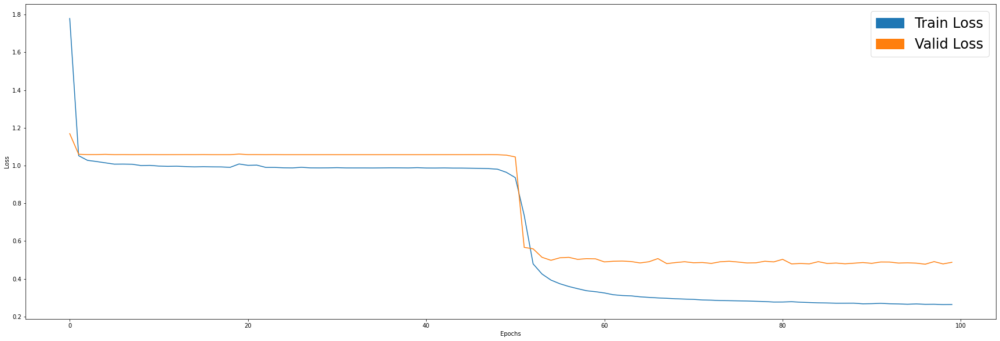

In [70]:
plotme(kouame_report['train_loss'], kouame_report['val_loss'], ax_t=['Loss', 'Epochs'], colors=['C0', 'C1'], lg=['Train Loss', 'Valid Loss'])

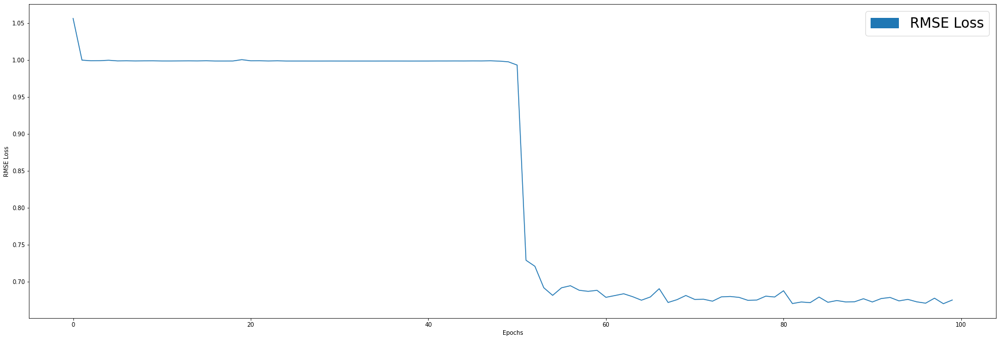

In [71]:
plotme(kouame_report['rmse_loss'], ax_t=['RMSE Loss', 'Epochs'], colors=['C0'], lg=['RMSE Loss'])

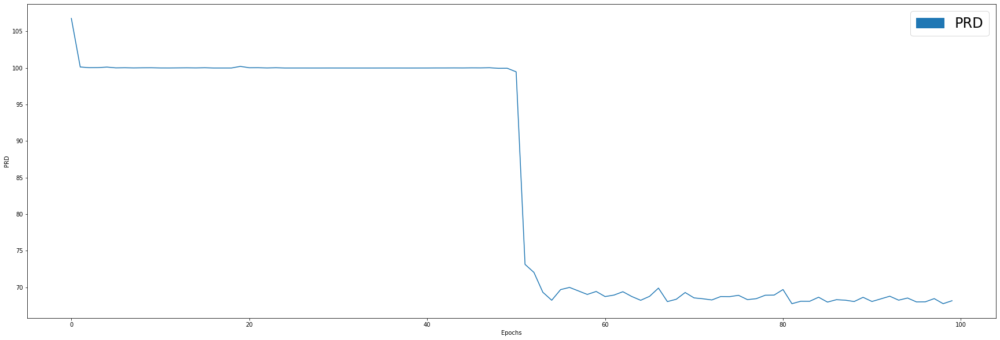

In [72]:
plotme(kouame_report['prd'], ax_t=['PRD', 'Epochs'], colors=['C0'], lg=['PRD'])

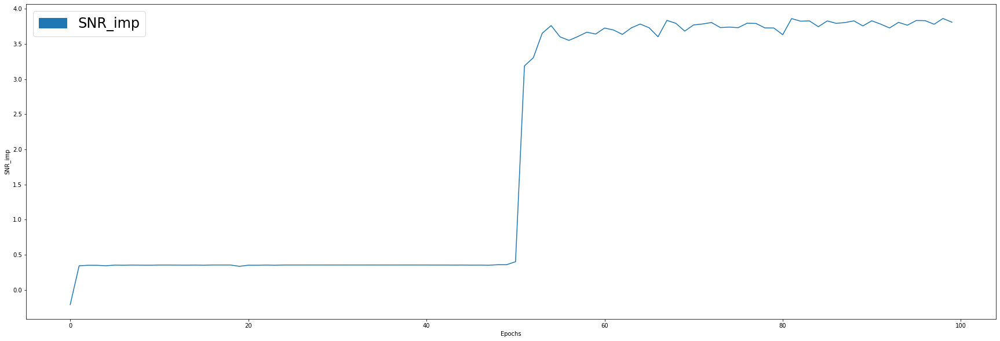

In [73]:
plotme(kouame_report['snr_imp'], ax_t=['SNR_imp', 'Epochs'], colors=['C0'], lg=['SNR_imp'])

In [93]:
out_full = kouame_model_saved(train_ds[:]['noisy'].to(device)).detach().cpu()
out_full.shape

torch.Size([2400, 1, 1024])

In [94]:
score = ((train_ds[:]['clean'] - out_full) ** 2).mean(axis=-1)[:,0]

In [95]:
score.argsort()

tensor([1833, 1835, 1860,  ..., 1975, 1977, 1976])

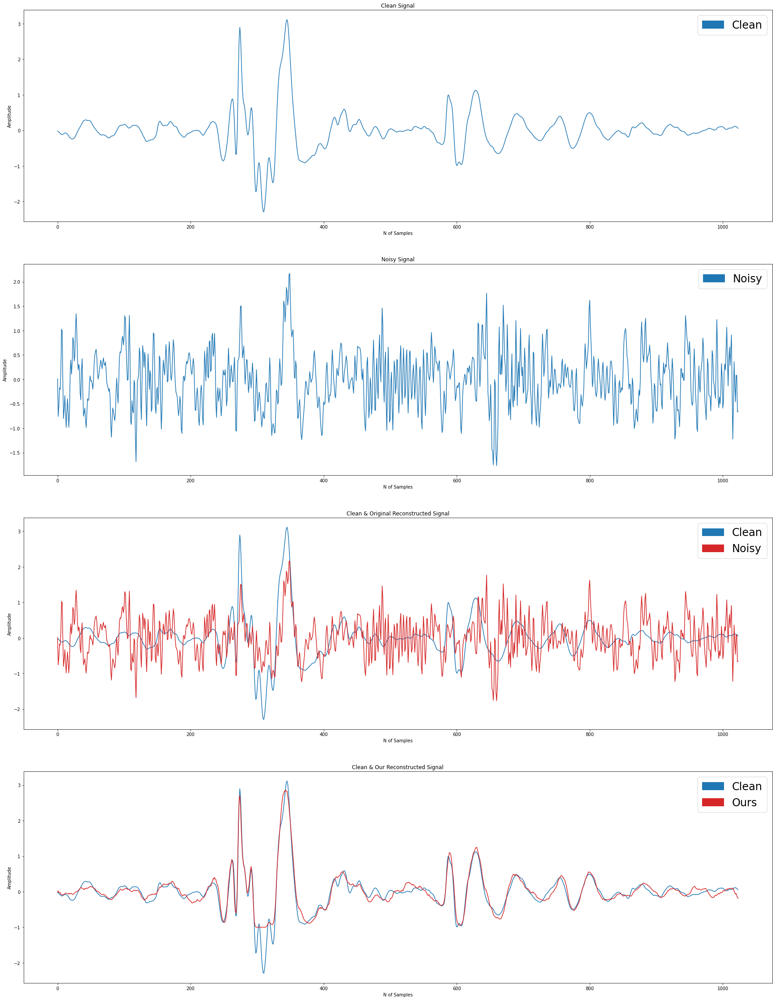

In [96]:
index = 1833
sample = train_ds[index]
s_clean = sample['clean'][0]
s_noisy = sample['noisy'][0]
output = out_full[index][0]
plot_report(s_clean, s_noisy, s_noisy, output, lg=['Clean', 'Noisy', 'Noisy', 'Ours'])

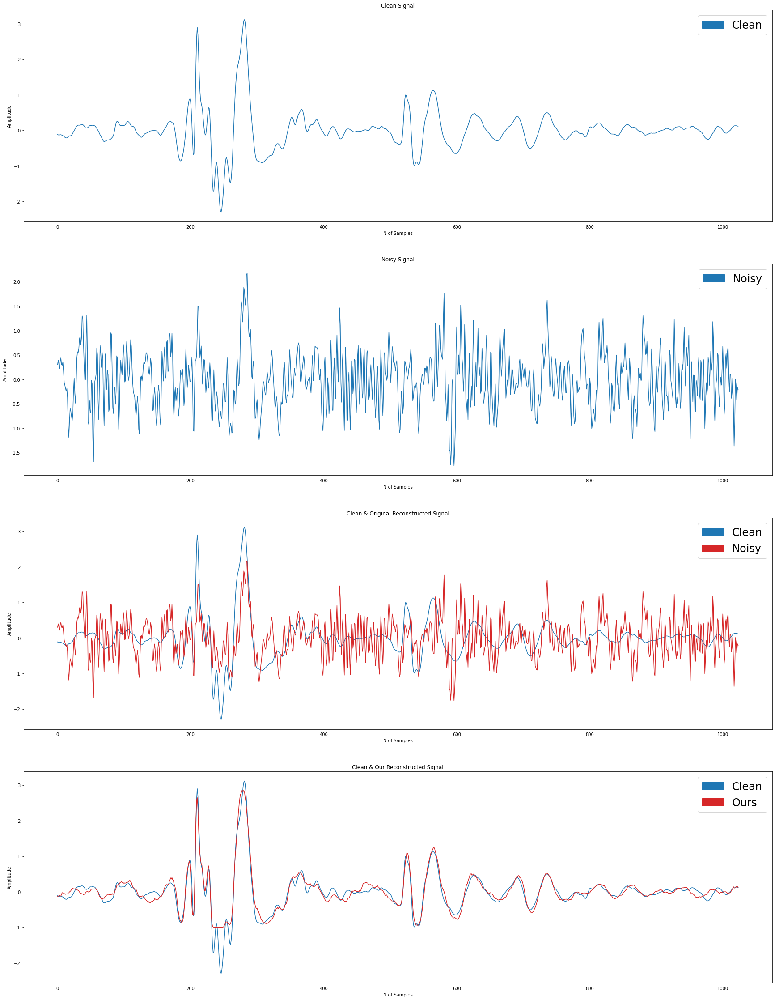

In [97]:
index = 1835
sample = train_ds[index]
s_clean = sample['clean'][0]
s_noisy = sample['noisy'][0]
output = out_full[index][0]
plot_report(s_clean, s_noisy, s_noisy, output, lg=['Clean', 'Noisy', 'Noisy', 'Ours'])

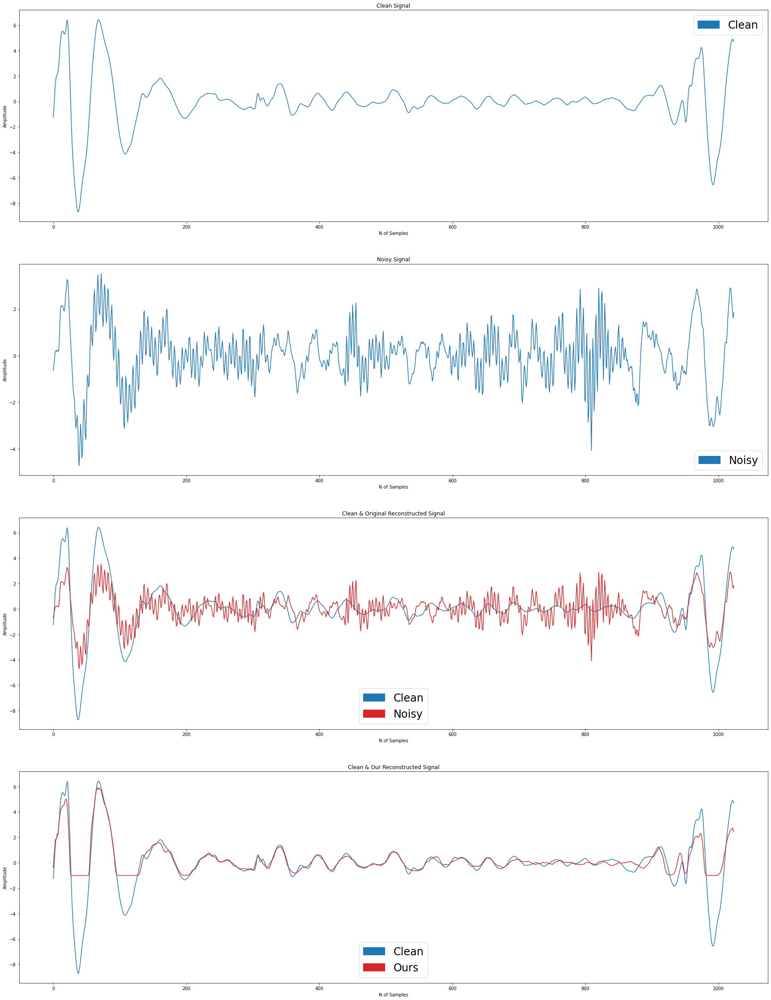

In [98]:
index = 1976
sample = train_ds[index]
s_clean = sample['clean'][0]
s_noisy = sample['noisy'][0]
output = out_full[index][0]
plot_report(s_clean, s_noisy, s_noisy, output, lg=['Clean', 'Noisy', 'Noisy', 'Ours'])

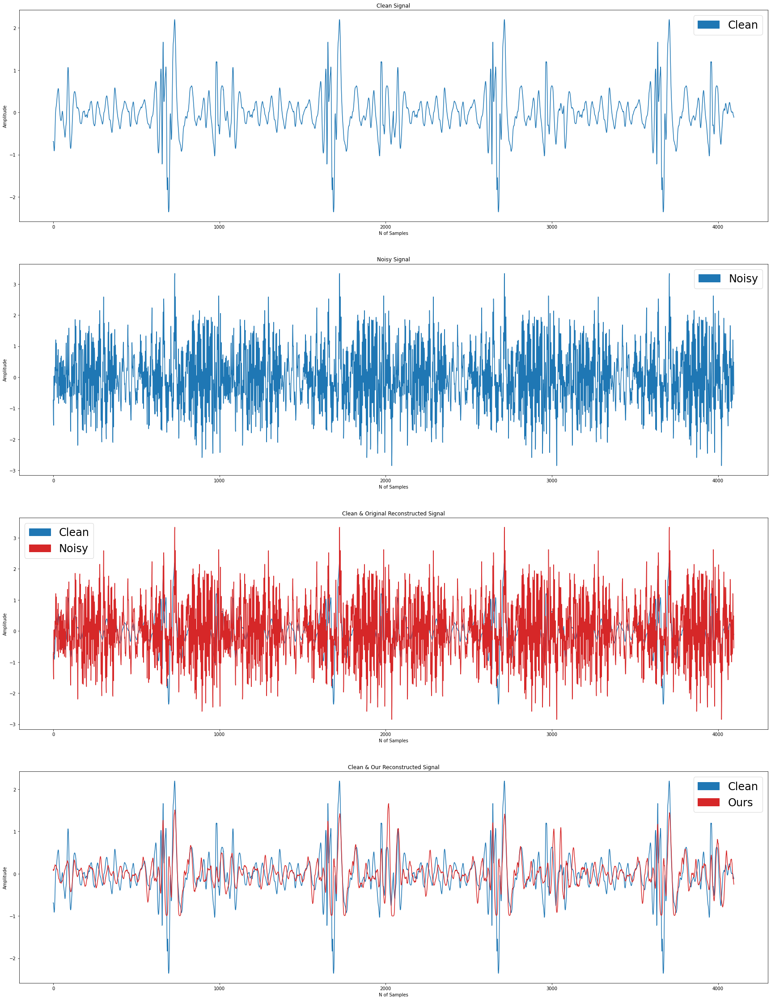

In [114]:
sample = dd_test
s_clean = sample['clean'].flatten()[:4096]
s_noisy = sample['noisy'].flatten()[:4096]
output = kouame_model_saved(torch.tensor(s_noisy, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device))[0][0].detach().cpu()
plot_report(s_clean, s_noisy, s_noisy, output, lg=['Clean', 'Noisy', 'Noisy', 'Ours'])